<a href="https://colab.research.google.com/github/Praneet9/Plant_Monitor/blob/master/Potatoes_Test/Plant_Monitoring_vgg16_early_stopping.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [9]:
!wget http://367a035e.ngrok.io/dataset.zip

--2019-01-08 07:22:49--  http://367a035e.ngrok.io/dataset.zip
Resolving 367a035e.ngrok.io (367a035e.ngrok.io)... 52.15.183.149, 2600:1f16:59e:b200:9824:7fb2:162:d476
Connecting to 367a035e.ngrok.io (367a035e.ngrok.io)|52.15.183.149|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 62190494 (59M) [application/zip]
Saving to: ‘dataset.zip.1’

dataset.zip.1       100%[===================>]  59.31M   184KB/s    in 5m 9s   

2019-01-08 07:27:59 (196 KB/s) - ‘dataset.zip.1’ saved [62190494/62190494]



In [0]:
!mv dataset.zip.1 dataset.zip

In [11]:
!unzip dataset.zip

Archive:  dataset.zip
   creating: dataset/
   creating: dataset/test/
   creating: dataset/test/Early_blight/
  inflating: dataset/test/Early_blight/034959c1-f1e8-4a79-a6d5-3c1d14efa2f3___RS_Early.B 7136_final_masked.jpg  
  inflating: dataset/test/Early_blight/042135e2-e126-4900-9212-d42d900b8125___RS_Early.B 8791_final_masked.jpg  
  inflating: dataset/test/Early_blight/0604174e-3018-4faa-9975-0be32d2c0789___RS_Early.B 7123_final_masked.jpg  
  inflating: dataset/test/Early_blight/07953ca1-8935-449f-b338-4357ed683b2d___RS_Early.B 6815_final_masked.jpg  
  inflating: dataset/test/Early_blight/08029ccc-387e-4be6-9389-04f7b82fdb2a___RS_Early.B 9130_final_masked.jpg  
  inflating: dataset/test/Early_blight/08194ca3-f0b2-4aaa-8df8-5ec5ddc6696a___RS_Early.B 8151_final_masked.jpg  
  inflating: dataset/test/Early_blight/08392b44-ecc6-4f38-8566-361b552cfe21___RS_Early.B 7393_final_masked.jpg  
  inflating: dataset/test/Early_blight/107827b3-faa5-457c-97fd-3e34d2657f6b___RS_Early.B 7162_fina

In [18]:
ls

dataset/  dataset.zip  logs/  models/  sample_data/


In [13]:
!mkdir logs

mkdir: cannot create directory ‘logs’: File exists


In [14]:
!mkdir models

mkdir: cannot create directory ‘models’: File exists


In [1]:
import numpy as np
import tensorflow as tf
import cv2
import os
import matplotlib.pyplot as plt

import keras

from keras.models import Sequential, Model
from keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Dropout, Input
from keras.utils import to_categorical
from keras.optimizers import SGD, RMSprop, adadelta, Adam

from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint, TensorBoard, EarlyStopping

Using TensorFlow backend.


In [0]:
img_rows = 224
img_cols = 224
num_channels = 3
epochs = 50
num_classes = 3
NAME = "vgg16_custom_epoch_" + str(epochs)

In [0]:
from keras import backend as K
K.set_image_dim_ordering('tf')

In [0]:
from keras.applications import vgg16

In [0]:
input_layer = Input(shape=(img_rows, img_cols, num_channels))

In [0]:
vgg_model = vgg16.VGG16(include_top=False, weights='imagenet', input_tensor=input_layer)

In [7]:
vgg_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

In [0]:
for i in range(4):
  vgg_model.layers.pop()

In [0]:
for layer in vgg_model.layers:
  layer.trainable = False

In [0]:
last_layer = vgg_model.get_layer('block4_pool').output

In [11]:
conv_1 = Conv2D(256, (3, 3), strides=(1, 1), activation='relu')(last_layer)
conv_2 = Conv2D(256, (3, 3), strides=(1, 1), activation='relu')(conv_1)
conv_3 = Conv2D(256, (3, 3), strides=(1, 1), activation='relu')(conv_2)
maxpool1 = MaxPooling2D(pool_size=(2, 2))(conv_3)

conv_4 = Conv2D(256, (3, 3), strides=(1, 1), activation='relu')(maxpool1)
maxpool2 = MaxPooling2D(pool_size=(2, 2))(conv_4)

flatten = Flatten()(maxpool2)

dense_1 = Dense(512, activation='relu')(flatten)
dense_2 = Dense(512, activation='relu')(dense_1)

output = Dense(num_classes, activation='softmax', name='output')(dense_2)

custom_vgg_model = Model(input_layer, output)
custom_vgg_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

In [12]:
train_datagen = ImageDataGenerator(
        rescale=1./255,
        featurewise_center=False,  # set input mean to 0 over the dataset
        samplewise_center=False,  # set each sample mean to 0
        shear_range=0.4,
        zoom_range=0.5,
        featurewise_std_normalization=False,  # divide inputs by std of the dataset
        samplewise_std_normalization=False,  # divide each input by its std
        zca_whitening=False,  # apply ZCA whitening
        # randomly rotate images in the range (degrees, 0 to 180)
        rotation_range=180,
        # randomly shift images horizontally (fraction of total width)
        width_shift_range=0.4,
        # randomly shift images vertically (fraction of total height)
        height_shift_range=0.4,
        horizontal_flip=True,  # randomly flip images
        vertical_flip=True)  # randomly flip images

test_datagen = ImageDataGenerator(
        rescale=1./255,
        featurewise_center=False,  # set input mean to 0 over the dataset
        samplewise_center=False,  # set each sample mean to 0
        shear_range=0.4,
        zoom_range=0.5,
        featurewise_std_normalization=False,  # divide inputs by std of the dataset
        samplewise_std_normalization=False,  # divide each input by its std
        zca_whitening=False,  # apply ZCA whitening
        # randomly rotate images in the range (degrees, 0 to 180)
        rotation_range=180,
        # randomly shift images horizontally (fraction of total width)
        width_shift_range=0.4,
        # randomly shift images vertically (fraction of total height)
        height_shift_range=0.4,
        horizontal_flip=True,  # randomly flip images
        vertical_flip=True)  # randomly flip images

train_generator = train_datagen.flow_from_directory(
        'dataset/train',
        target_size=(img_rows, img_cols),
        color_mode="rgb",
        batch_size=32,
        class_mode="categorical",
        shuffle=True,)

test_generator = test_datagen.flow_from_directory(
        'dataset/test',
        target_size=(img_rows, img_cols),
        color_mode="rgb",
        batch_size=32,
        class_mode="categorical",
        shuffle=True,)

Found 5563 images belonging to 3 classes.
Found 1089 images belonging to 3 classes.


In [0]:
tensorboard = TensorBoard(log_dir = 'logs/' + NAME)

In [0]:
augmented_checkpoint = EarlyStopping(monitor='val_loss', min_delta=0, patience=3, verbose=1, mode='auto', restore_best_weights=False)

In [0]:
# augmented_checkpoint = ModelCheckpoint('augmented_best_model.hdf5',  # model filename
#                                        monitor='val_loss',  # quantity to monitor
#                                        verbose=1,  # verbosity - 0 or 1
#                                        save_best_only=True,  # The latest best model will not be overwritten
#                                        mode='auto')  # The decision to overwrite model is made
# automatically depending on the quantity to monitor

In [0]:
custom_vgg_model.compile(loss=keras.losses.categorical_crossentropy,  # Better loss function for neural networks
              optimizer=Adam(lr=0.001, decay=1e-6),  # Adam optimizer with 1.0e-4 learning rate
              metrics=['accuracy'])  # Metrics to be evaluated by the model

In [17]:
history = custom_vgg_model.fit_generator(generator=train_generator,
                    validation_data=test_generator,
                    epochs=epochs,
                    callbacks=[augmented_checkpoint, tensorboard],
                    verbose=1,
                    steps_per_epoch=128,
                    validation_steps=32,
)

Epoch 1/50
128/128 [==============================] - 84s 652ms/step - loss: 0.9539 - acc: 0.5151 - val_loss: 0.9163 - val_acc: 0.4541
Epoch 2/50
128/128 [==============================] - 77s 600ms/step - loss: 0.6257 - acc: 0.7267 - val_loss: 0.6056 - val_acc: 0.7774
Epoch 3/50
128/128 [==============================] - 76s 595ms/step - loss: 0.4593 - acc: 0.8295 - val_loss: 0.5402 - val_acc: 0.8036
Epoch 4/50
128/128 [==============================] - 76s 596ms/step - loss: 0.3866 - acc: 0.8545 - val_loss: 0.4143 - val_acc: 0.8469
Epoch 5/50
128/128 [==============================] - 76s 595ms/step - loss: 0.3946 - acc: 0.8596 - val_loss: 0.4102 - val_acc: 0.8479
Epoch 6/50
128/128 [==============================] - 76s 593ms/step - loss: 0.3505 - acc: 0.8742 - val_loss: 0.3475 - val_acc: 0.8640
Epoch 7/50
128/128 [==============================] - 75s 586ms/step - loss: 0.3258 - acc: 0.8827 - val_loss: 0.3623 - val_acc: 0.8721
Epoch 8/50
128/128 [==============================] - 7

In [18]:
# serialize model to JSON
model_json = custom_vgg_model.to_json()
with open("models/model.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
custom_vgg_model.save_weights("models/model.h5")
print("Saved model to disk")

Saved model to disk


In [0]:
%matplotlib inline

import glob
import matplotlib
from matplotlib import pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import imageio as im
from keras import models
from keras.preprocessing import image

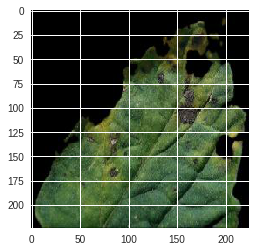

In [20]:
img_path = 'dataset/train/Early_blight/0012b9d2-2130-4a06-a834-b1f3af34f57e___RS_Erly.B 8389_final_masked.jpg'

img = image.load_img(img_path, target_size=(img_rows, img_cols))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.

plt.imshow(img_tensor[0])
plt.show()

In [0]:
layer_outputs = [layer.output for layer in custom_vgg_model.layers[1:]] # Extracts the outputs of the top 12 layers
activation_model = models.Model(inputs=custom_vgg_model.input, outputs=layer_outputs) # Creates a model that will return these outputs, given the model input

In [0]:
activations = activation_model.predict(img_tensor) # Returns a list of five Numpy arrays: one array per layer activation

In [23]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 224, 224, 64)


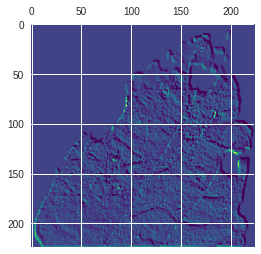

In [24]:
plt.matshow(first_layer_activation[0, :, :, 4], cmap='viridis')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide


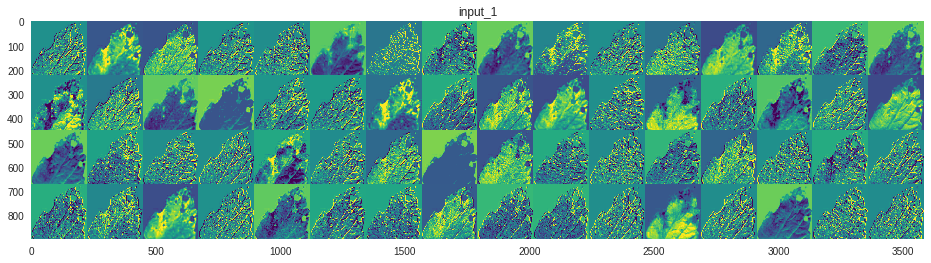

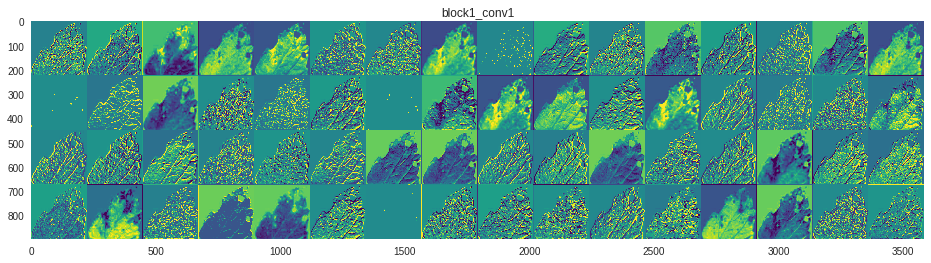

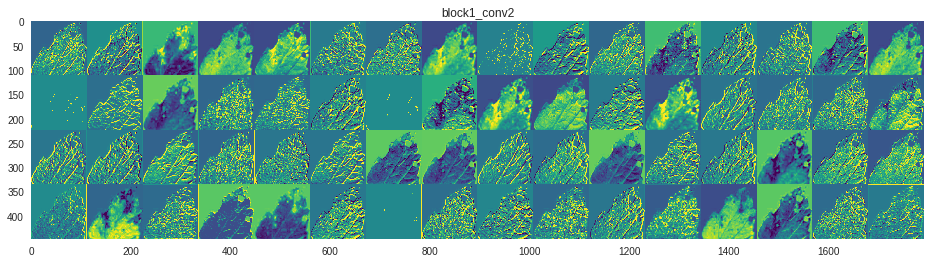

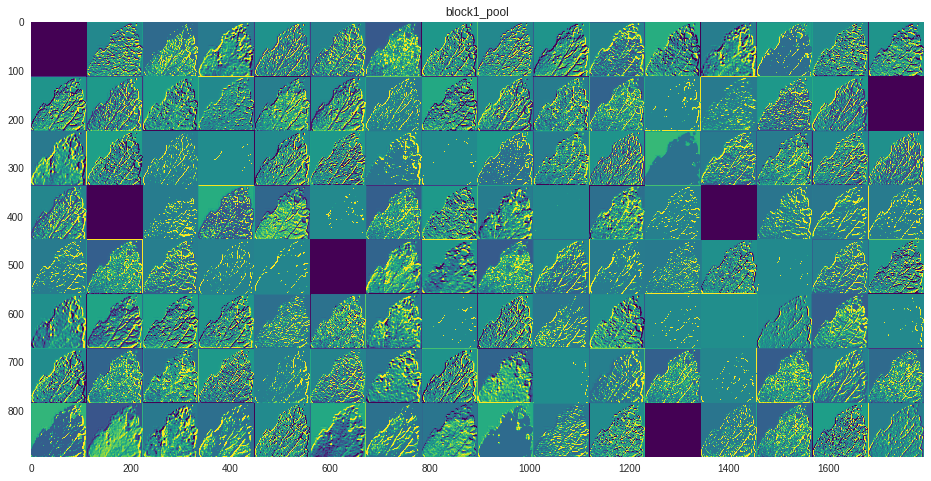

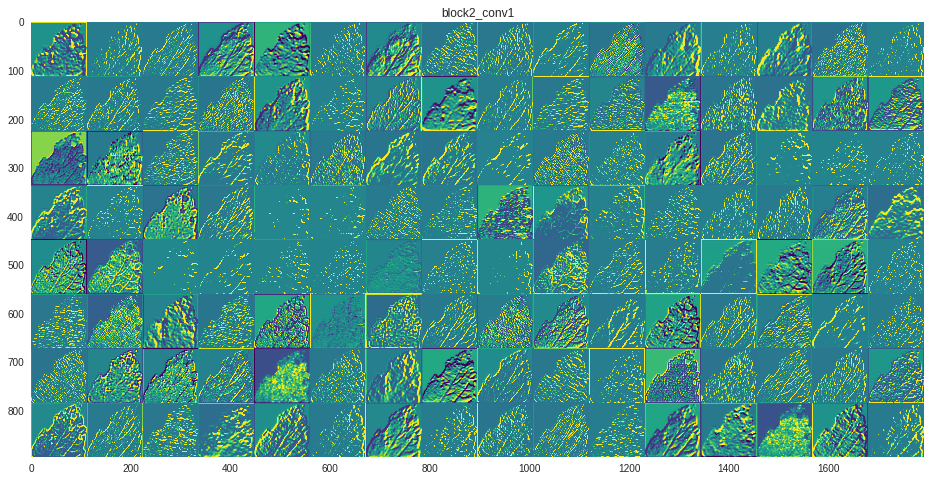

...

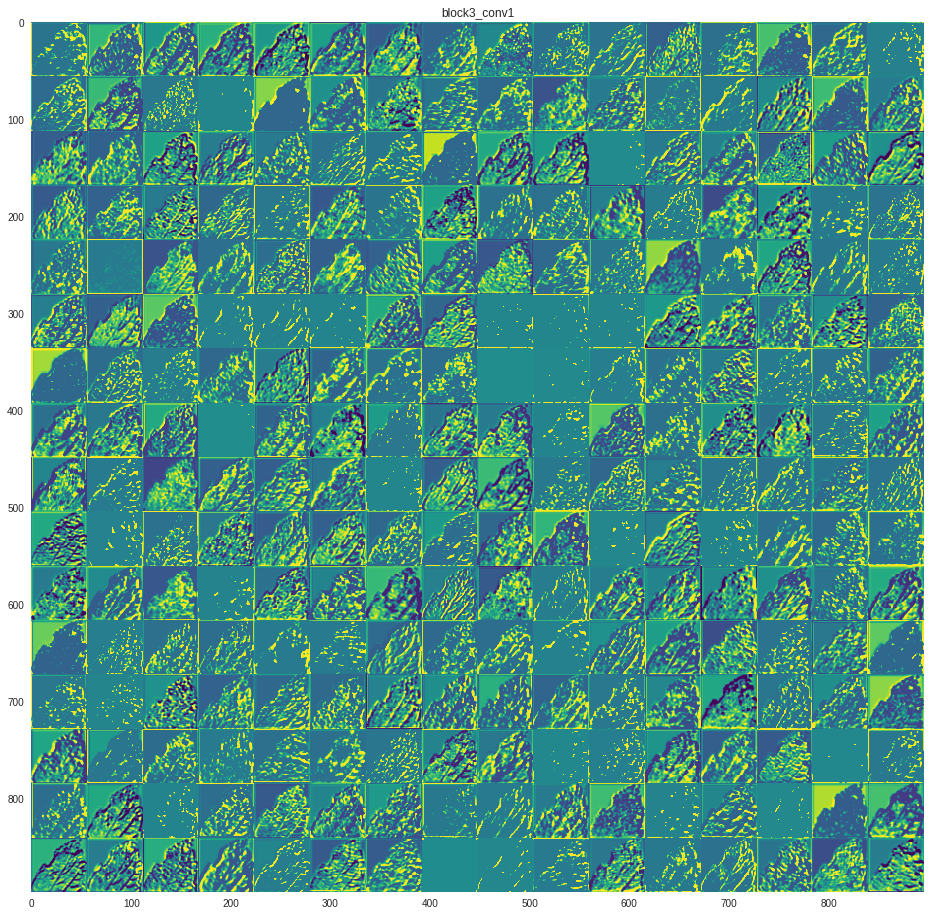

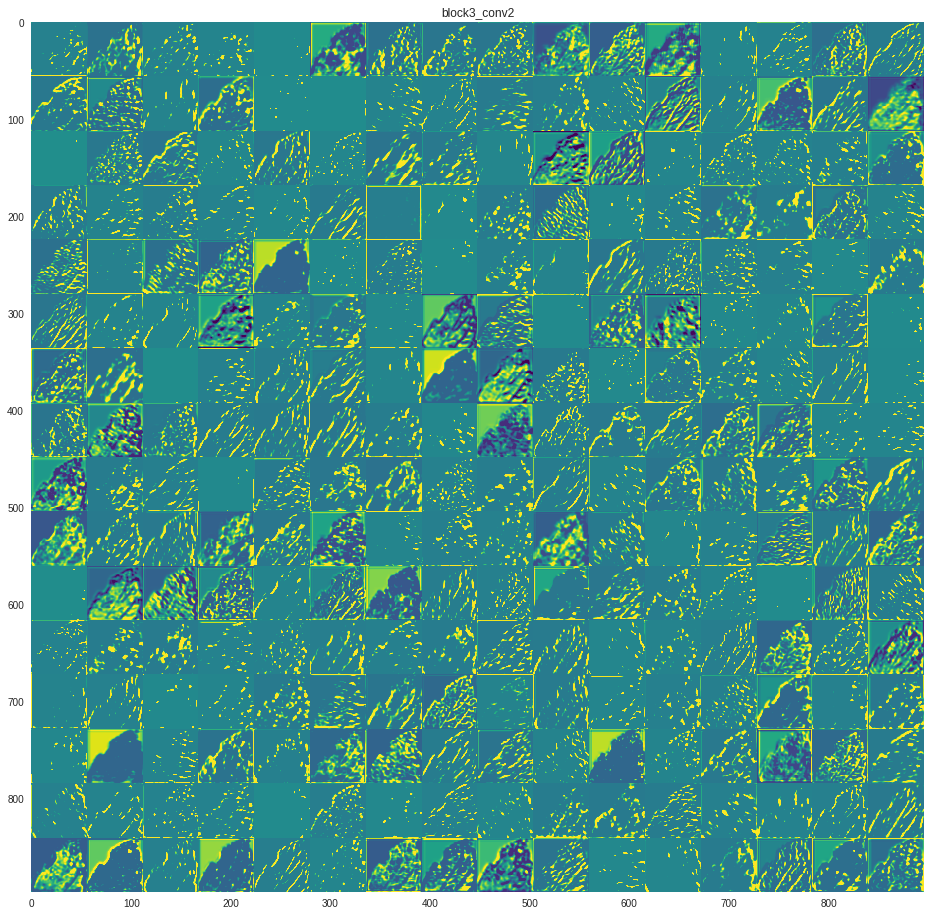

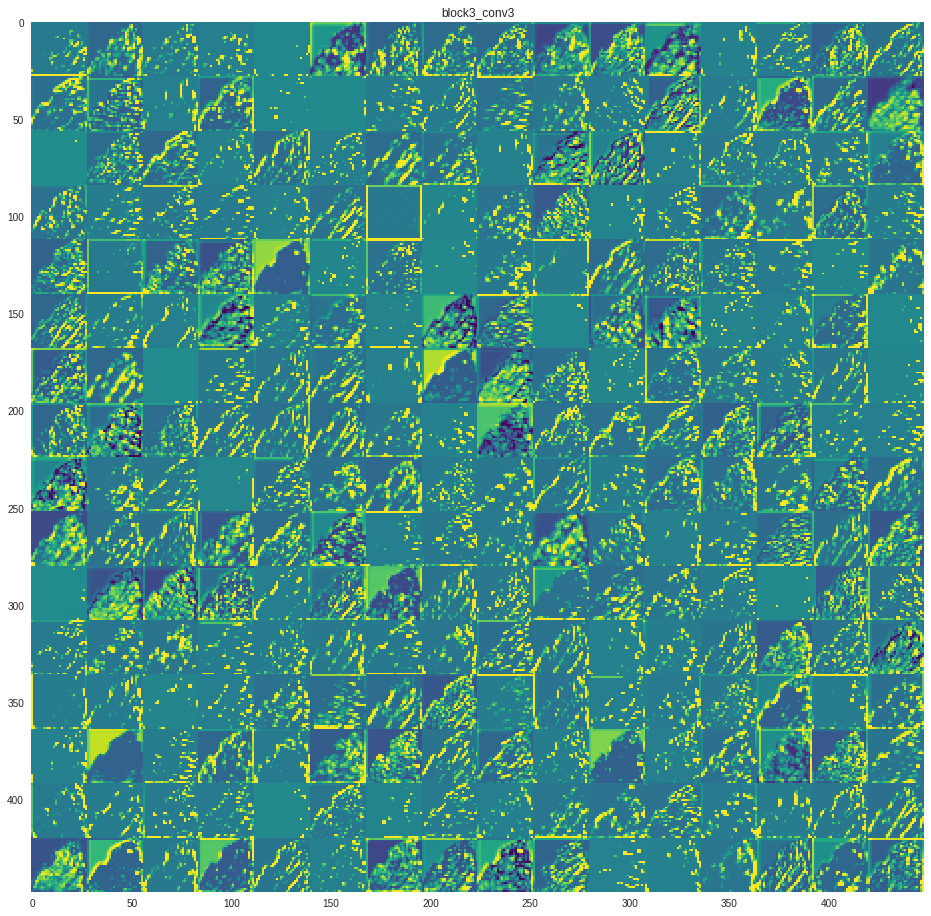

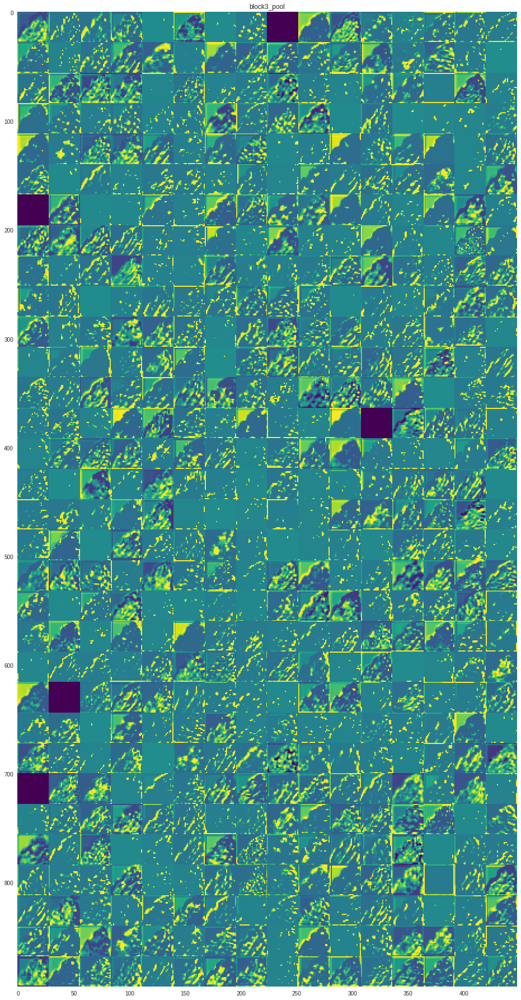

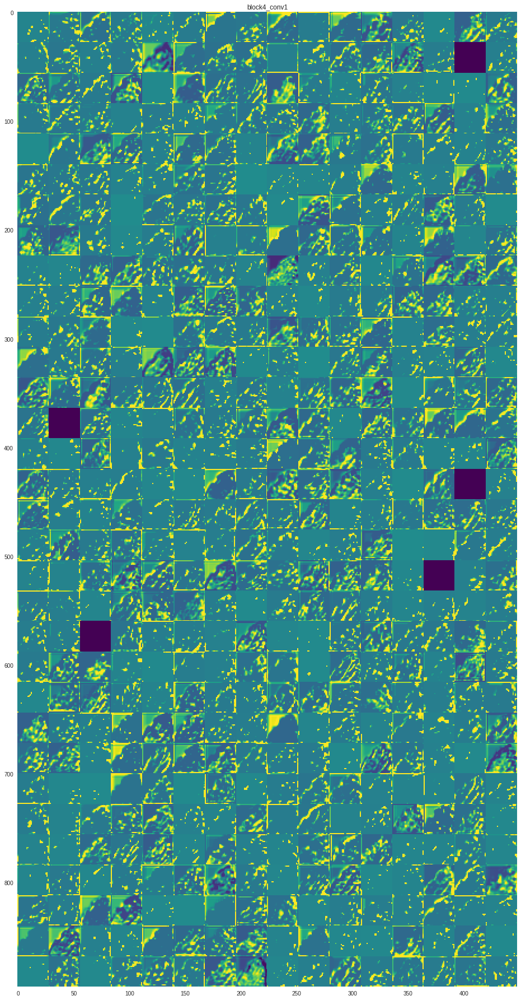

In [25]:
layer_names = []
for layer in custom_vgg_model.layers[:12]:
    layer_names.append(layer.name) # Names of the layers, so you can have them as part of your plot
    
images_per_row = 16

for layer_name, layer_activation in zip(layer_names, activations): # Displays the feature maps
    n_features = layer_activation.shape[-1] # Number of features in the feature map
    size = layer_activation.shape[1] #The feature map has shape (1, size, size, n_features).
    n_cols = n_features // images_per_row # Tiles the activation channels in this matrix
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    for col in range(n_cols): # Tiles each filter into a big horizontal grid
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            channel_image -= channel_image.mean() # Post-processes the feature to make it visually palatable
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size, # Displays the grid
                         row * size : (row + 1) * size] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')